In [1]:
import numpy as np
import scipy.linalg as linalg
from JSAnimation import IPython_display
import matplotlib.pyplot as plt
from matplotlib import animation

from optic_flow import *

from multiprocessing import Pool, Manager, Process,TimeoutError
import time
import os

In [2]:
def get_drifting_sinus(im_size,omega,theta,lambd):
    im_centre = (np.array(im_size[1:])/2).astype(int)
    x,t,y = np.meshgrid(np.arange(0,im_size[1]), np.arange(0,im_size[0]), np.arange(0,im_size[2]))
    k = 2*np.pi/lambd
    return  np.cos(k*(np.cos(theta)*(x-im_centre[0]) + np.sin(theta)*(y-im_centre[1])-omega*t))  

def get_drifting_sinusoids(im_size,omega,theta,lambd):
    x,t,y = np.meshgrid(np.arange(0,im_size[1]), np.arange(0,im_size[0]), np.arange(0,im_size[2]))
    response = np.zeros(im_size)
    
    for om, thet, lambd_ in zip(omega, theta, lambd):
        
        response += get_drifting_sinus(im_size, om, thet, lambd_)
    response /= len(omega)
    return response


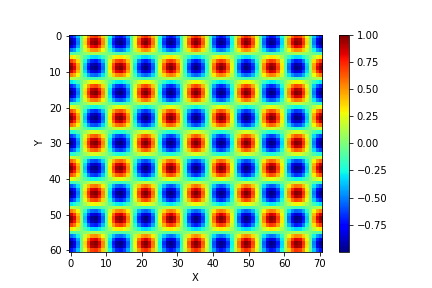
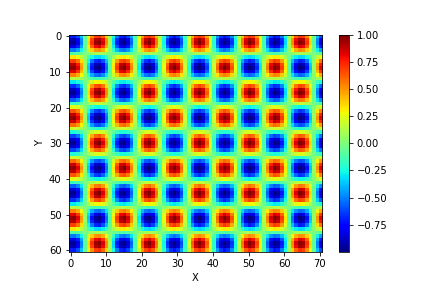
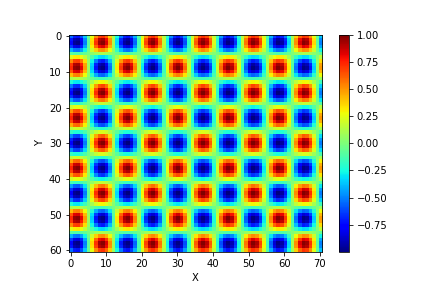
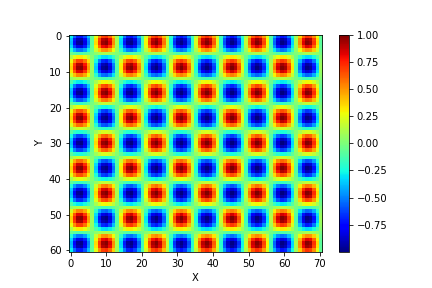
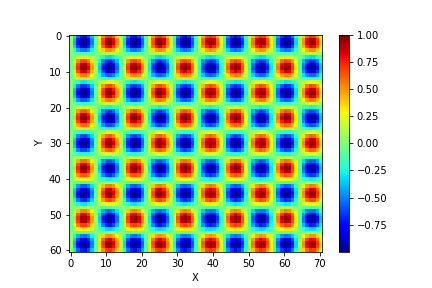
...
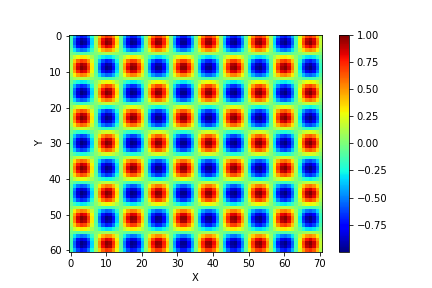
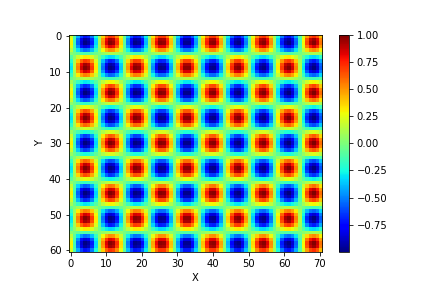
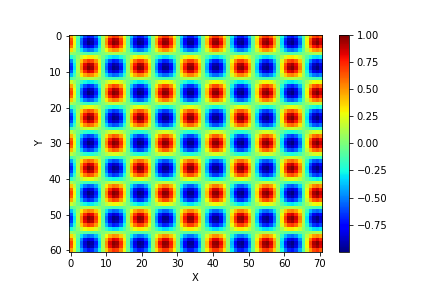
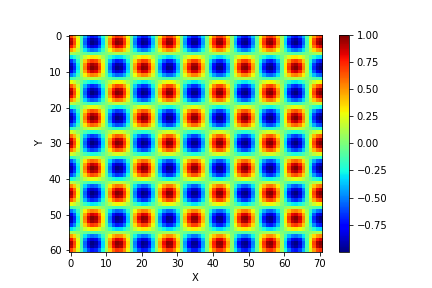
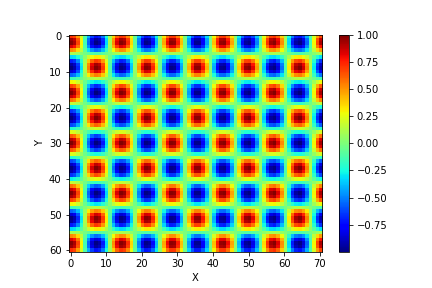

In [3]:
%matplotlib inline

im_shape = (51,71,61)

stimulus = get_drifting_sinusoids(im_shape, [1/np.sqrt(2),1/np.sqrt(2)], [np.pi/4,-np.pi/4], [10,10])

def animate(i):
    im.set_array(stimulus[i,:,:].T)
    return im

vmin1 = stimulus.min(); vmax1 = stimulus.max()

fig = plt.figure()
ax = fig.add_subplot(1,1,1)
ax.set_xlabel('X')
ax.set_ylabel('Y')
im = ax.imshow(stimulus[0,:,:].T, cmap="jet")
fig.colorbar(im)
animation.FuncAnimation(fig, animate, frames=stimulus.shape[0], interval=50)

In [4]:
import matlab.engine
eng = matlab.engine.start_matlab()
stimulus2 = eng.optic_flow(200, 0.,  0., .5, 1);
stimulus2 = np.array(stimulus2)

In [8]:
%%time

v_x, v_y = optic_flow(stimulus)

CPU times: user 388 ms, sys: 356 ms, total: 744 ms
Wall time: 1min 3s



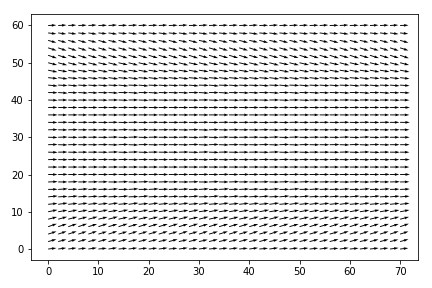
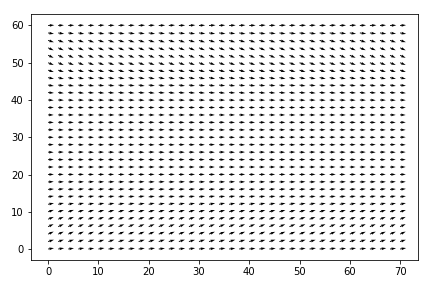
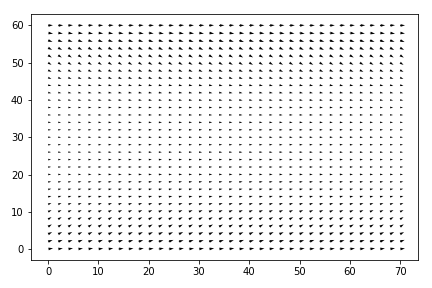
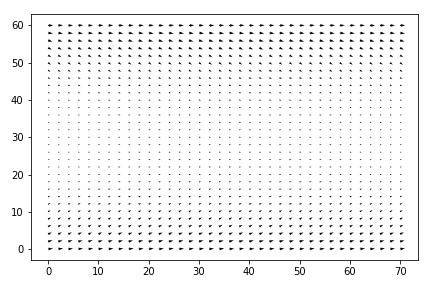
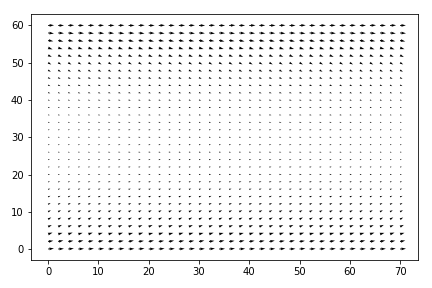
...
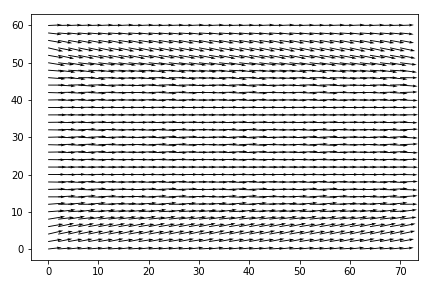
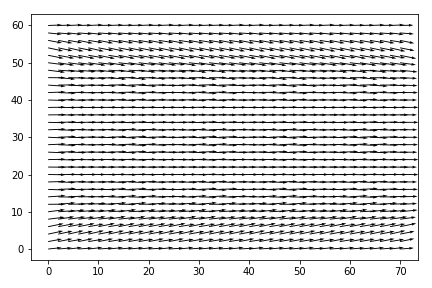
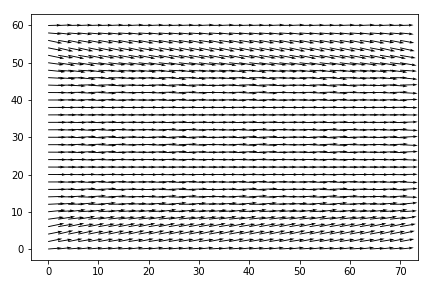
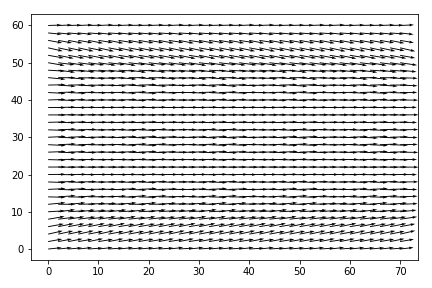
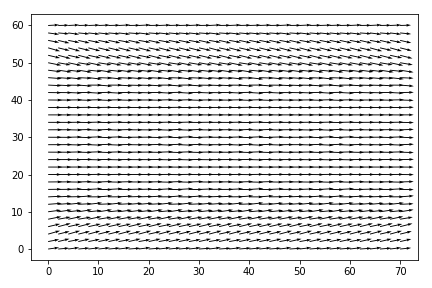

In [9]:
fig = plt.figure()
ax = fig.add_subplot(111)
spacing = 2
time = im_shape[0]
x_shape = im_shape[1]
y_shape = im_shape[2]
im_show = []
(X, T, Y) = np.meshgrid(np.arange(0, x_shape), np.arange(0, time), np.arange(0, y_shape))
Q = ax.quiver(X[0,::spacing,::spacing], Y[0,::spacing,::spacing], 
                   v_x[0,::spacing,::spacing], v_y[0,::spacing,::spacing], 
                    pivot='tail', color='k', units='xy', scale = .05)
im_show.append(Q)
def animate(i):  
    """
        Dynamically setting what is displayed on the different plots.
    """
    im_show[0].set_UVC(v_x[i,::spacing,::spacing],v_y[i,::spacing,::spacing])
    return im_show
plt.tight_layout()

animation.FuncAnimation(fig, animate, frames=T.shape[0], interval=50)


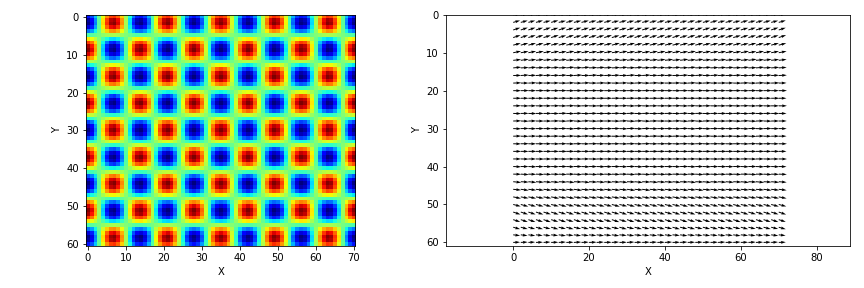
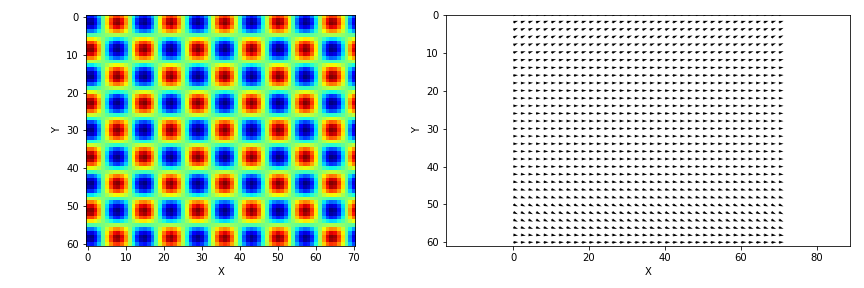
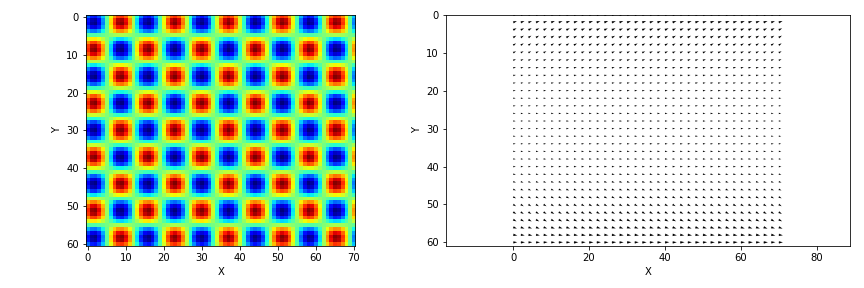
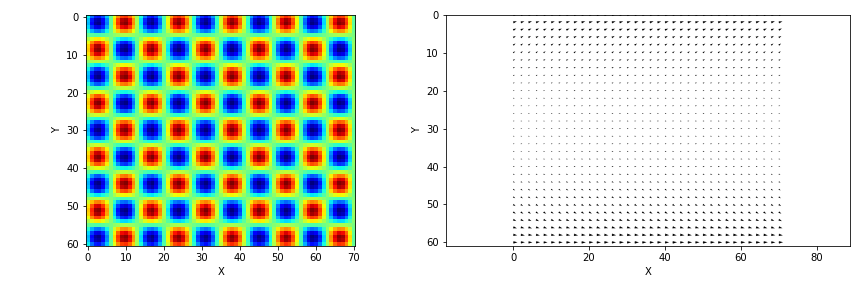
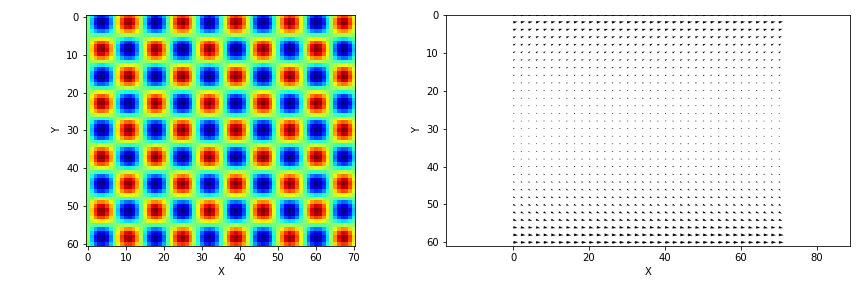
...
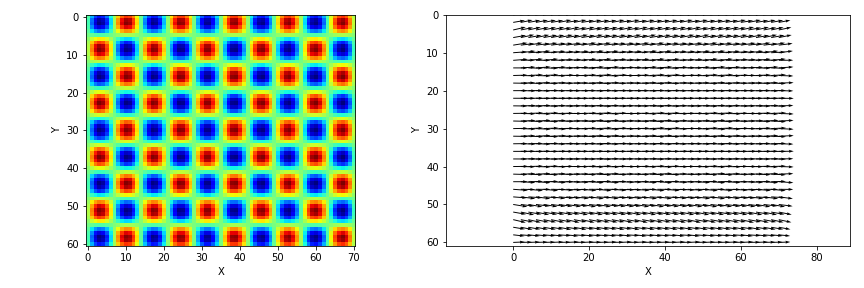
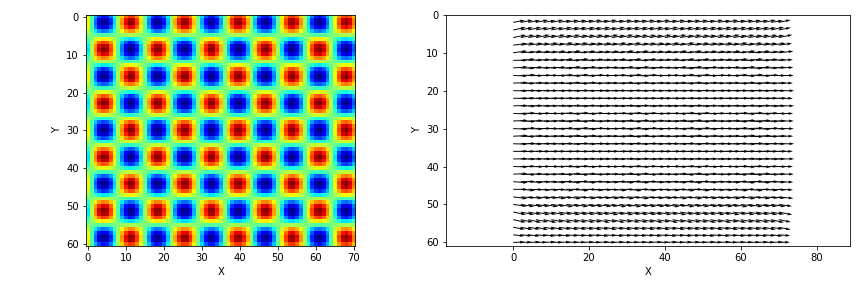
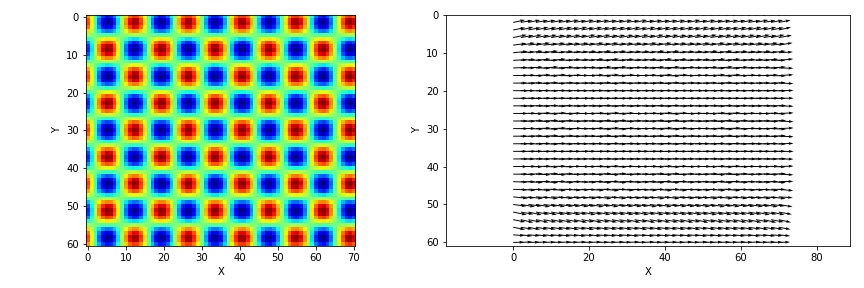
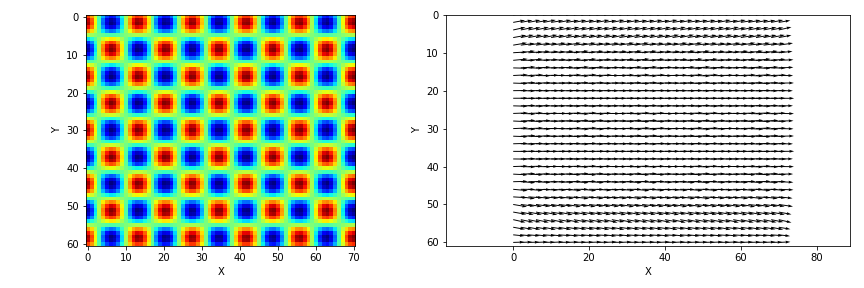
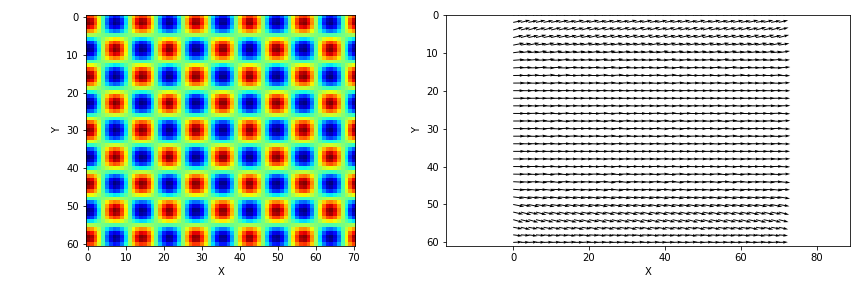

In [10]:
fig = plt.figure(figsize=(12,4))

axes = []
im_show = []

(X, T, Y) = np.meshgrid(np.arange(0, stimulus.shape[1]), np.arange(0,  stimulus.shape[0]), np.arange(0, stimulus.shape[2]))

axes.append(fig.add_subplot(1,2,1))

vmin1 = stimulus.min(); vmax1 = stimulus.max()

im = axes[0].imshow(stimulus[0,:,:].T, cmap="jet", vmin = vmin1, vmax = vmax1)
im_show.append(im)

axes.append(fig.add_subplot(1,2,2))

spacing = 2

Q = axes[1].quiver(X[0,::spacing,::spacing], Y[0,::spacing,::spacing], 
                   v_x[0,::spacing,::spacing], v_y[0,::spacing,::spacing], 
                    pivot='tail', color='k', units='xy', scale = .05)#.0002)
im_show.append(Q)

plt.axis('equal')
for j, ax in enumerate(axes):
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    if j == 1:
        ax.set_xlim([0, stimulus.shape[1]])
        ax.set_ylim([stimulus.shape[2],0])

def animate(i):  
    """
        Dynamically setting what is displayed on the different plots.
    """
    im_show[0].set_array(stimulus[i,:,:].T)
    im_show[1].set_UVC(v_x[i,::spacing,::spacing],v_y[i,::spacing,::spacing])
    return im_show

plt.tight_layout()

animation.FuncAnimation(fig, animate, frames=T.shape[0], interval=50)

## Estimating the velocity (translation and rotation) and depth of the stimulus 

Just from the optic flow information, the translation (only the direction, because the absolute translation and the depth are multiplied in equations for their estimation), the rotation and the depth (with some amount of error) can be obtained, using a linear subspace method as outlined by Heeger and Jepson (1992), and reviewed in Raudies and Neumann (2012).

### Estimating the direction of translation
The translation vector (henceforth a unit vector, $T$) can be recovered by calculating the estimated minimum of the residual function $E(T)$ calculated as follows. $v(x,y)$ represents the velocity (optic flow) at the point $(x,y)$ in the 2D optic plane, and $C(T)$ is a calculated matrix which does not need the optic flow information and hence can be precomputed in a parallel way beforehand from the image characteristics ( ( $\textbf{TO BE DONE!!}$ ) ):

$$
\begin{equation}
v(x,y) = p(x,y)A(x,y)T + B(x,y)\Omega
\end{equation}\\
p(x,y) = \frac{1}{Z} \\
A(x,y) =
\begin{bmatrix}
-f & 0 & x \\
0 & -f & y \\
\end{bmatrix}\\
B(x,y) =
\begin{bmatrix}
(xy)/f & -(f + x^{2}/f) & y\\
f + y^{2}/f & -(xy)/f & -x\\
\end{bmatrix}\\
A(T) = 
\begin{bmatrix}
A(x_{1},y_{1})T & \cdots & 0 \\
\vdots & \ddots & \vdots \\
0 & \cdots & A(x_{N},y_{N})T\\
\end{bmatrix}\\
B = 
\begin{bmatrix}
B(x_{1},y_{1}) \\
\vdots \\
B(x_{N},y_{N})\\
\end{bmatrix}\\
C(T) = 
\begin{bmatrix}
\vdots & \vdots\\
A(T) & B\\
\vdots & \vdots\\
\end{bmatrix}\\
$$

Once we calculate $C(T)$, we calculate the residual function $E(T)$ as follows :

$$
E(T) = ||(I - \bar{C}\bar{C}^{t})v||^{2}\\
\implies E(T) = ||v^{t}C^{\bot}(T)||^{2}
$$
where the two expressions can be shown to be equivalent. $\bar{C}$ can be shown to be an orthogonal component which is obtained by QR decomposition of the matrix $C$. In the second expression, $C^{\bot}(T)$ is an orthogonal complement to $C(T)$. The minimum argument of $T$ which achieves this is taken to be the candidate translation direction. 


In [11]:
def sample_T(): #to get a systematic number of T's (use for ||n later)
    for theta in np.arange(0,np.pi,0.01):
        for phi in np.arange(0,np.pi,0.01):
            x = np.cos(theta)*np.sin(phi)
            y = np.sin(theta)*np.sin(phi)
            z = np.cos(phi)
    return np.array([[x],[y],[z]])

def calculate_CT_estimate(sample_points, T): #input the presampled sample points - can be precalculated
    N = np.shape(sample_points)[0]; #justincase
    A_T = np.zeros([2*N,N]) #preallocate ndarrays for storing the matrices
    B = np.zeros([2*N,3])
    
    for i in np.arange(0,N,1):
        x,y = sample_points[i,0],sample_points[i,1]
        
        #calculating A_T
        A = np.array([[-f,0,x],[0,-f,y]])
        AtimesT = np.dot(A,T)
        A_T[2*i,i], A_T[2*i+1,i] = AtimesT[0], AtimesT[1]
        
        #calculating B
        B[2*i] = np.array([(x*y)/f, -(f + (x*x)/f), y])
        B[2*i+1] = np.array([f + (y*y)/f, -(x*y)/f, -x])
    return np.concatenate((A_T,B),axis=1)

# check if correct or required
def calculate_perp_CT(sample_points, T): #input the presampled sample points - can be precalculated
    CT = calculate_CT_estimate(sample_points,T)
    return linalg.orth(CT)
#probably not required 

def calculate_ET_qr(sample_v_x,sample_v_y, T):
    N = np.shape(sample_points)[0];
    CT = calculate_CT_estimate(sample_points,T)
    v = np.vstack((sample_v_x,sample_v_y)).reshape((-1),order='F').reshape(2*N,1)
    CTbar, discard = np.linalg.qr(CT)
    I = np.identity(2*N)
    CC = np.dot(CTbar,np.transpose(CTbar))
    E_T = (np.linalg.norm(np.dot((I - CC),v)))**2
    return E_T

## Add the saved and parallelised version of the C(T) calculations here and put an estimate of the time and memory needed for the same

In [12]:
CPU_NUMBER = os.cpu_count()

pool = Pool(CPU_NUMBER)        



Process ForkPoolWorker-32:
Process ForkPoolWorker-29:
Process ForkPoolWorker-31:
Process ForkPoolWorker-28:
Process ForkPoolWorker-30:
Process ForkPoolWorker-27:
Process ForkPoolWorker-26:
Process ForkPoolWorker-25:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/home/sharbat/anaconda3/lib/python3.5/multiprocessing/process.py", line 249, in _bootstrap
    self.run()
Traceback (most recent call last):
Traceback (most recent call last):
  File "/home/sharbat/anaconda3/lib/python3.5/multiprocessing/process.py", line 249, in _bootstrap
    self.run()
  File "/home/sharbat/anaconda3/lib/python3.5/multiprocessing/process.py", line 249, in _bootstrap
    self.run()
  File "/home/sharbat/anaconda3/lib/python3.5/multiprocessing/process.py", line 249, in _bootstrap
    self.run()
  File "/home/sharbat/anaconda3/lib/python3.5/mu

In [23]:
%%time
stim_time = 3
x_lim = x_shape
y_lim = y_shape
N = 10 #number of random points
f = 15 #focal length
search_range = np.arange(0,np.pi,0.01)
E = np.zeros((np.size(search_range),np.size(search_range)))

for time in np.arange(0,stim_time,1): 
    ## gather some sample points
#     for x_split in np.arange(x_lim-1,0,-10):
#         for y_split in np.arange(y_lim-1,0,-10):
    sample_points = np.transpose([np.random.randint(0,x_lim,size=N),np.random.randint(0,y_lim,size=N)])
    sample_v_x, sample_v_y = v_x[time,sample_points[:,0],sample_points[:,1]], v_y[time,sample_points[:,0],sample_points[:,1]]

    ## run through all candidate translation directions
    for idtheta,theta in enumerate(list(search_range)):
        for idphi,phi in enumerate(list(search_range)):
            x = np.cos(theta)*np.sin(phi)
            y = np.sin(theta)*np.sin(phi)
            z = np.cos(phi)
            T = np.array([[x],[y],[z]])
            E_T = calculate_ET_qr(sample_v_x,sample_v_y,T)
            E[idtheta,idphi] += E_T

    idtheta, idphi = np.unravel_index(E.argmin(), E.shape)

    theta, phi = search_range[idtheta], search_range[idphi]
    x_final = np.cos(theta)*np.sin(phi)
    y_final = np.sin(theta)*np.sin(phi)
    z_final = np.cos(phi)
    T_final = np.array([[x_final],[y_final],[z_final]])
    
    ##rotation together
    sum_left = np.zeros([3,3])
    sum_right = np.zeros([3,1])
    for i in np.arange(0,N,1):
        x,y = sample_points[i,0],sample_points[i,1]

        #calculating d
        A = np.array([[-f,0,x],[0,-f,y]])
        AtimesT = np.dot(A,T)
        d = np.array([[AtimesT[1,0]],[-AtimesT[0,0]]])
        di = d/linalg.norm(d)

        #calculating left term in omega estimate
        Bi = np.array([[(x*y)/f, -(f + (x*x)/f), y],[f + (y*y)/f, -(x*y)/f, -x]])
        sum_left += np.dot(np.transpose(Bi),np.dot(di,np.dot(np.transpose(di),Bi)))
        
        #calculating right term in omega estimate
        sample_v_x,sample_v_y = v_x[time,x,y],v_y[time,x,y]
        vi = np.array([[sample_v_x],[sample_v_y]])
        sum_right += np.dot(np.transpose(Bi),np.dot(di,np.dot(np.transpose(di),vi)))
        
    omega = np.dot(linalg.inv(sum_left),sum_right)
    print('time = {}, translation = {}, rotation = {}'.format(time,T_final,omega))
            
            

time = 0, translation = [[ 0.88145056]
 [ 0.44774682]
 [ 0.15022547]], rotation = [[ 0.00253095]
 [-0.00771653]
 [ 0.00027343]]
time = 1, translation = [[ 0.90272699]
 [ 0.40313309]
 [ 0.15022547]], rotation = [[ 0.00241938]
 [-0.0032959 ]
 [ 0.00061925]]
time = 2, translation = [[ 0.89022862]
 [ 0.43002944]
 [ 0.15022547]], rotation = [[ 0.00198869]
 [-0.0023703 ]
 [ 0.00033785]]
CPU times: user 6min 39s, sys: 3.87 s, total: 6min 43s
Wall time: 1min 54s


[[ 0.89022862]
 [ 0.43002944]
 [ 0.15022547]]


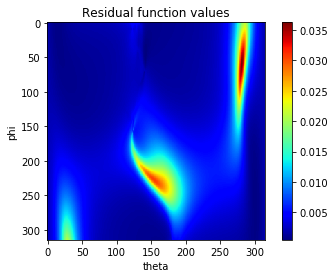

In [24]:
#plotting residual surfaces
fig = plt.figure()
ax = fig.add_subplot(1,1,1)
ax.set_xlabel('theta')
ax.set_ylabel('phi')
im = ax.imshow(E, cmap="jet")
fig.colorbar(im)
ax.set_title('Residual function values')
theta, phi = search_range[idtheta], search_range[idphi]
x_final = np.cos(theta)*np.sin(phi)
y_final = np.sin(theta)*np.sin(phi)
z_final = np.cos(phi)
T_final = np.array([[x_final],[y_final],[z_final]])
print(T_final)

### Estimating the value of rotation, given the direction of translation

The estimate of $\Omega$ is given by the following : 
$$
\hat{\Omega} = \Bigg[ \sum_{i}B^{t}_{i}d_{i}d^{t}_{i}B_{i} \Bigg]^{-1} \Bigg[ \sum_{i}B^{t}_{i}d_{i}d^{t}_{i}v_{i} \Bigg]
$$

In [18]:
T = np.array([[0],[1],[0]])

In [23]:
#estimating rotation given the translation

N = np.shape(sample_points)[0]; #justincase
f = 15
sum_left = np.zeros([3,3])
sum_right = np.zeros([3,1])

for time in np.arange(20,21,1):
    for i in np.arange(0,N,1):
        x,y = sample_points[i,0],sample_points[i,1]

        #calculating d
        A = np.array([[-f,0,x],[0,-f,y]])
        AtimesT = np.dot(A,T)
        d = np.array([[AtimesT[1,0]],[-AtimesT[0,0]]])
        di = d/linalg.norm(d)

        #calculating left term in omega estimate
        Bi = np.array([[(x*y)/f, -(f + (x*x)/f), y],[f + (y*y)/f, -(x*y)/f, -x]])
        sum_left += np.dot(np.transpose(Bi),np.dot(di,np.dot(np.transpose(di),Bi)))
        
        #calculating right term in omega estimate
        sample_v_x,sample_v_y = v_x[time,x,y],v_y[time,x,y]
        vi = np.array([[sample_v_x],[sample_v_y]])
        sum_right += np.dot(np.transpose(Bi),np.dot(di,np.dot(np.transpose(di),vi)))

omega = np.dot(linalg.inv(sum_left),sum_right)
print(omega)

[[-0.00230991]
 [-0.00132592]
 [ 0.00633045]]


### Estimating the value of the depth given the direction of translation and the rotation
From the equation $v(x,y) = p(x,y)A(x,y)T + B(x,y)\Omega$, we can substitute the values of $T$ and $\Omega$ to get the estimated depth at every point of the image

In [39]:
#calculating depth
depth_mat0 = np.zeros([x_lim,y_lim])
depth_mat1 = np.zeros([x_lim,y_lim])
for x in np.arange(0,x_lim,1):
    for y in np.arange(0,y_lim,1):
        A = np.array([[-f,0,x],[0,-f,y]])
        B = np.array([[(x*y)/f, -(f + (x*x)/f), y],[f + (y*y)/f, -(x*y)/f, -x]])
        v = np.array([[v_x[x,y]],[v_y[x,y]]])
        scaled_AT = v - np.dot(B,omega)
        act_AT = np.dot(A,T)
        depth0 = (act_AT/scaled_AT)
        depth1 = (act_AT/scaled_AT)
        print(depth0[0,0])
        depth_mat0[x,y] = depth0[0,0,0]
        depth_mat1[x,y] = depth1[0,0]


[ 0.4305648   0.42708813  0.43217238  0.42619964  0.41945909  0.41632917
  0.3963413   0.37382828  0.37713431  0.37608199  0.35437357  0.34472454
  0.35037708  0.35298389  0.33954883  0.3408114   0.34744084  0.35047744
  0.34282173  0.3438827   0.35296069  0.34612958  0.34476167  0.34783374
  0.35281232  0.3452736   0.34485692  0.35235367  0.34636095  0.34464264
  0.34636095  0.35235367  0.34485692  0.3452736   0.35281232  0.34783374
  0.34476167  0.34612958  0.35296069  0.3438827   0.34282173  0.35047744
  0.34744084  0.3408114   0.33954883  0.35298389  0.35037708  0.34472454
  0.35437357  0.37608199  0.37713431  0.37382828  0.3963413   0.41632917
  0.41945909  0.42619964  0.43217238  0.42708813  0.4305648   0.44022233
  0.44022233]


ValueError: setting an array element with a sequence.

NameError: name 'depth_mat' is not defined

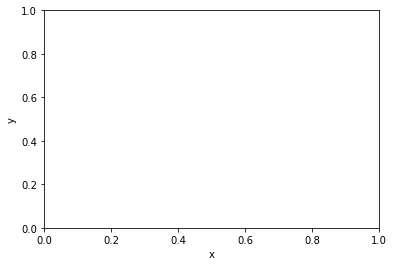

In [26]:
#plotting depth
%matplotlib inline
fig = plt.figure()
ax = fig.add_subplot(1,1,1)
ax.set_xlabel('x')
ax.set_ylabel('y')
im = ax.imshow(depth_mat, cmap="jet")
fig.colorbar(im)
ax.set_title('Depth values')